##### Baselines
1. Random Sampling
2. Cluster Sampling / K-means

##### Metrics
1. Diversity -> Simpson's Index
2. Representativeness -> KL Divergence
3. Sample size effeciency -> Evaluate against the achieved diversity and representativeness

##### Ablation Study
1. Similarity Only
2. Density Only
3. Similarity + Density

In [50]:
from transformers import ViTImageProcessor, ViTModel
from PIL import Image
from datasets import load_dataset
import torch
import torch.nn.functional as F
import random
from sklearn.cluster import KMeans
import numpy as np
import math
import matplotlib.pyplot as plt
from datasets import Dataset

In [40]:
### Import Dataset

DEVICE = "cuda:0"


def init_feature_extractor():
    processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
    model = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
    model.to(DEVICE)
    model.eval()
    return processor, model


def create_dataset(n_samples=3618):
    dataset = load_dataset(
        "imagefolder",
        data_dir="/workspaces/ModelHubTest/src/data/assets/cat_vs_dog",
        split="test",
    )
    dataset = dataset.shuffle(seed=42).select(range(n_samples))
    return dataset


def predict_batch(processor, model, batch):
    images = [
        image.convert("RGB") if image.mode != "RGB" else image
        for image in batch.values()
    ]
    inputs = processor(images=images, return_tensors="pt")
    inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
    cls_embeddings = outputs.last_hidden_state[:, 0, :]
    cls_embeddings = F.normalize(cls_embeddings, p=2, dim=1)
    embeddings_dict = {
        idx: embedding for idx, embedding in zip(batch.keys(), cls_embeddings)
    }
    return embeddings_dict


def batched_dataset(dataset, batch_size):
    batch = {}
    for idx, item in enumerate(dataset):
        batch[idx] = item["image"]
        if len(batch) == batch_size:
            yield batch
            batch = {}
    if batch:
        yield batch


def create_embeddings_for_sampling():
    embeddings_dict = {}
    batch_size = 128
    processor, model = init_feature_extractor()
    dataset = create_dataset()
    for batch in batched_dataset(dataset, batch_size):
        result = predict_batch(processor, model, batch)
        embeddings_dict.update(result)
    return dataset, embeddings_dict

def display_images(dataset, img_indices):
    print(f"Displaying {len(img_indices)} images!")
    num_images = len(img_indices)
    num_cols = 5
    num_rows = math.ceil(num_images / num_cols)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))
    axes = axes.flatten()
    for idx, image_idx in enumerate(img_indices):
        image = dataset[image_idx]["image"]
        axes[idx].imshow(image)
        axes[idx].set_title(f"Image Index: {image_idx}")
        axes[idx].axis("off")
    for ax in axes[num_images:]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()


In [3]:
### Random Sampling
def random_sampling(embeddings, n_samples=100):
    sampled_idx = random.sample(list(embeddings.keys()), n_samples)
    sampled_embeddings = {idx: embeddings[idx] for idx in sampled_idx}
    return sampled_embeddings

In [48]:
### K-means Sampling
def kmeans_sampling(embeddings, n_clusters=10, n_samples=100):
    embedding_array = np.array([embedding.cpu() for embedding in embeddings.values()])
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(embedding_array)
    cluster_indices = {i: [] for i in range(n_clusters)}
    for idx, label in zip(embeddings.keys(), kmeans.labels_):
        cluster_indices[label].append(idx)

    samples_per_cluster = n_samples // n_clusters
    sampled_indices = []
    for indices in cluster_indices.values():
        if len(indices) >= samples_per_cluster:
            sampled_indices.extend(random.sample(indices, samples_per_cluster))
        else:
            sampled_indices.extend(indices)
    
    sampled_embeddings = {idx: embeddings[idx] for idx in sampled_indices}
    return sampled_embeddings, sampled_indices

In [36]:
dataset, embeddings_dict = create_embeddings_for_sampling()
embeddings_dict

Resolving data files:   0%|          | 0/3618 [00:00<?, ?it/s]

{0: tensor([ 3.2809e-02, -1.2385e-02,  7.4652e-02, -2.6630e-02,  5.9267e-02,
         -6.3954e-02,  2.7539e-02, -1.9081e-02,  1.9331e-03, -1.8315e-02,
         -1.7462e-02, -2.2502e-02,  4.2959e-02, -6.3278e-02, -2.5203e-03,
          2.8831e-02,  4.5823e-02, -2.4898e-02,  3.6250e-02,  1.5858e-02,
         -7.1518e-02,  5.7601e-02, -3.2886e-02,  3.3113e-02, -3.0856e-02,
          5.8162e-02,  9.6358e-02, -2.1352e-02,  7.7285e-03,  1.6412e-02,
         -2.9480e-02,  3.9991e-02,  5.7228e-02, -1.6377e-02,  2.2905e-02,
         -1.2699e-02, -7.1224e-02, -5.7138e-02, -6.3493e-03, -3.0597e-03,
          1.6524e-02, -2.3652e-02,  3.8900e-03, -6.6008e-02,  2.0602e-02,
         -4.8730e-03, -5.2744e-02, -5.9430e-02,  7.2567e-02, -1.2003e-02,
          3.3144e-02, -2.3685e-02,  3.9331e-03,  3.8343e-03,  2.8583e-02,
         -5.0519e-02, -9.1426e-03, -2.3324e-02,  2.3691e-02,  2.5504e-02,
          7.8908e-03,  3.1565e-02,  3.6856e-02,  5.8095e-03, -1.6144e-03,
         -3.3236e-02, -2.3782e-03, 

Displaying 10 images!


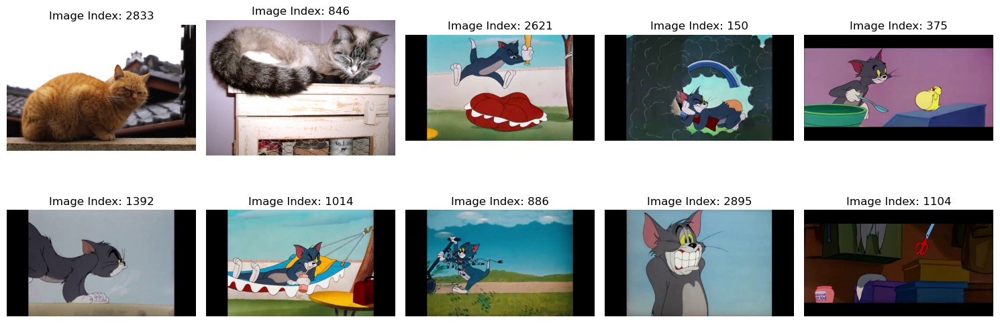

In [41]:
random_embeddings = random_sampling(embeddings_dict, n_samples=10)
display_images(dataset, random_embeddings.keys())

In [52]:
def convert_to_hf_dataset(dataset, sampled_indices):
    sampled_data = [dataset[idx] for idx in sampled_indices]
    hf_dataset = Dataset.from_dict({key: [d[key] for d in sampled_data] for key in sampled_data[0]})
    return hf_dataset

In [54]:
kmeans_embeddings, kmeans_indices = kmeans_sampling(embeddings_dict, n_clusters=10, n_samples=10)
kmeans_sampled_images = [dataset[idx] for idx in kmeans_indices]
hf_dataset = convert_to_hf_dataset(dataset, kmeans_indices)
hf_dataset.num_rows

10

In [56]:
sample_count = [i for i in range(250, 0, -50)]
sample_count

[250, 200, 150, 100, 50]